In [ ]:
!pip install sklearn torch torchvision timm einops

     |████████████████████████████████| 245kB 3.0MB/s 


In [ ]:
!git clone https://github.com/mszarski/differnet

Cloning into 'differnet'...
remote: Enumerating objects: 50, done.
remote: Total 50 (delta 0), reused 0 (delta 0), pack-reused 50
Unpacking objects: 100% (50/50), done.


In [ ]:
import sys
sys.path.append("differnet")

In [ ]:
import numpy as np
import os
import pickle
from tqdm.autonotebook import tqdm
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.covariance import LedoitWolf
from scipy.spatial.distance import mahalanobis
import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import timm

from torch import nn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  after removing the cwd from sys.path.


In [ ]:
torch.manual_seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(0)

# device setup
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
class LimitDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, n):
        self.dataset = dataset
        self.n = n

    def __len__(self):
        return self.n

    def __getitem__(self, i):
        return self.dataset[i]

class AdjustableSizeDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, n):
        self.dataset = dataset
        self.n = n

    def __len__(self):
        return self.n

    def __getitem__(self, i):
        i = i % len(self.dataset)
        return self.dataset[i]

In [ ]:
class RepeatSingleChannelInto3DFromTensor(object):
    def __init__(self, channel_idx):
        self.channel_idx = channel_idx

    def __call__(self, img):
        # torch image: C X H X W
        x = img[self.channel_idx,:,:].unsqueeze(0)
        x = x.repeat(3, 1, 1)
        return x

In [ ]:
class ChannelMeanInto3DFromTensor(object):
    def __call__(self, img):
        # torch image: C X H X W
        x = torch.mean(img, 0, keepdim=True)
        x = x.repeat(3, 1, 1)
        return x

In [ ]:
# data settings
dataset_path = "/content/drive/My Drive/anomaly_workspace/combined_img_data/"
class_name = "fod"
# norm_mean, norm_std = [0.5622, 0.1476, 0.8228], [0.4120, 0.0514, 0.1583]

# dataset_path = "/content/drive/My Drive/anomaly_workspace/"
# class_name = "grid"
norm_mean, norm_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

transform = transforms.Compose(
        [transforms.Resize([384, 384]),
         transforms.ToTensor(),
         RepeatSingleChannelInto3DFromTensor(2),
         #ChannelMeanInto3DFromTensor(),
         transforms.Normalize(norm_mean, norm_std)])

data_dir_train = os.path.join(dataset_path, class_name, 'train')
data_dir_test = os.path.join(dataset_path, class_name, 'test')

train_dataset = datasets.ImageFolder(data_dir_train, transform=transform)
#train_dataset = LimitDataset(train_dataset,8)
#train_dataset = AdjustableSizeDataset(train_dataset,512)
train_dataloader = DataLoader(train_dataset, batch_size=8, pin_memory=False)
test_dataset = datasets.ImageFolder(data_dir_test, transform=transform)
#test_dataset = AdjustableSizeDataset(test_dataset,512)
test_dataloader = DataLoader(test_dataset, batch_size=8, pin_memory=False)

In [ ]:
from timm.data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
def _cfg(url='', **kwargs):
    return {
        'url': url,
        'num_classes': 1000, 'input_size': (3, 224, 224), 'pool_size': None,
        'crop_pct': .9, 'interpolation': 'bicubic',
        'mean': IMAGENET_DEFAULT_MEAN, 'std': IMAGENET_DEFAULT_STD,
        'first_conv': 'patch_embed.proj', 'classifier': 'head',
        **kwargs
    }

In [ ]:
import torch
import torch.nn as nn
from functools import partial
from einops import rearrange

from timm.data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.models.layers import DropPath, to_2tuple, trunc_normal_
from timm.models.resnet import resnet26d, resnet50d

class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x


class Attention(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False,attn_drop=0., proj_drop=0.):
        super().__init__()
        self.num_heads = num_heads
        head_dim = dim // num_heads
        # NOTE scale factor was wrong in my original version, can set manually to be compat with prev weights
        self.scale = head_dim ** -0.5

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

        self.attn_gradients = None
        self.attention_map = None

    def save_attn_gradients(self, attn_gradients):
        self.attn_gradients = attn_gradients

    def get_attn_gradients(self):
        return self.attn_gradients

    def save_attention_map(self, attention_map):
        self.attention_map = attention_map

    def get_attention_map(self):
        return self.attention_map

    def forward(self, x, register_hook=False):
        b, n, _, h = *x.shape, self.num_heads

        # self.save_output(x)
        # x.register_hook(self.save_output_grad)

        qkv = self.qkv(x)
        q, k, v = rearrange(qkv, 'b n (qkv h d) -> qkv b h n d', qkv = 3, h = h)

        dots = torch.einsum('bhid,bhjd->bhij', q, k) * self.scale

        attn = dots.softmax(dim=-1)
        attn = self.attn_drop(attn)

        out = torch.einsum('bhij,bhjd->bhid', attn, v)

        self.save_attention_map(attn)
        if register_hook:
            attn.register_hook(self.save_attn_gradients)

        out = rearrange(out, 'b h n d -> b n (h d)')
        out =  self.proj(out)
        out = self.proj_drop(out)
        return out


class Block(nn.Module):

    def __init__(self, dim, num_heads, mlp_ratio=4., qkv_bias=False, drop=0., attn_drop=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm):
        super().__init__()
        self.norm1 = norm_layer(dim)
        self.attn = Attention(
            dim, num_heads=num_heads, qkv_bias=qkv_bias, attn_drop=attn_drop, proj_drop=drop)
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

    def forward(self, x, register_hook=False):
        x = x + self.attn(self.norm1(x), register_hook=register_hook)
        x = x + self.mlp(self.norm2(x))
        return x


class PatchEmbed(nn.Module):
    """ Image to Patch Embedding
    """
    def __init__(self, img_size=224, patch_size=16, in_chans=3, embed_dim=768):
        super().__init__()
        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)
        num_patches = (img_size[1] // patch_size[1]) * (img_size[0] // patch_size[0])
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = num_patches

        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        B, C, H, W = x.shape
        # FIXME look at relaxing size constraints
        assert H == self.img_size[0] and W == self.img_size[1], \
            f"Input image size ({H}*{W}) doesn't match model ({self.img_size[0]}*{self.img_size[1]})."
        x = self.proj(x).flatten(2).transpose(1, 2)
        return x

class ModifiedVisionTransformer(nn.Module):
    """ Vision Transformer
    """
    def __init__(self, img_size=224, patch_size=16, in_chans=3, num_classes=1000, embed_dim=768, depth=12,
                 num_heads=12, mlp_ratio=4., qkv_bias=False, drop_rate=0., attn_drop_rate=0., norm_layer=nn.LayerNorm):
        super().__init__()
        self.num_classes = num_classes
        self.num_features = self.embed_dim = embed_dim  # num_features for consistency with other models
        self.patch_embed = PatchEmbed(
                img_size=img_size, patch_size=patch_size, in_chans=in_chans, embed_dim=embed_dim)
        num_patches = self.patch_embed.num_patches

        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, embed_dim))
        self.pos_drop = nn.Dropout(p=drop_rate)

        self.blocks = nn.ModuleList([
            Block(
                dim=embed_dim, num_heads=num_heads, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias,
                drop=drop_rate, attn_drop=attn_drop_rate, norm_layer=norm_layer)
            for i in range(depth)])
        self.norm = norm_layer(embed_dim)

        # Classifier head
        self.head = nn.Linear(embed_dim, num_classes) if num_classes > 0 else nn.Identity()

        trunc_normal_(self.pos_embed, std=.02)
        trunc_normal_(self.cls_token, std=.02)
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)

    @torch.jit.ignore
    def no_weight_decay(self):
        return {'pos_embed', 'cls_token'}

    def forward(self, x, register_hook=False):
        B = x.shape[0]
        x = self.patch_embed(x)

        cls_tokens = self.cls_token.expand(B, -1, -1)  # stole cls_tokens impl from Phil Wang, thanks
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.pos_drop(x)

        for blk in self.blocks:
            x = blk(x, register_hook=register_hook)

        x = self.norm(x)
        x = x[:, 0]
        x = self.head(x)
        return x

    def forward_features(self, x, register_hook=False):
        B = x.shape[0]
        x = self.patch_embed(x)

        cls_tokens = self.cls_token.expand(B, -1, -1)  # stole cls_tokens impl from Phil Wang, thanks
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.pos_drop(x)

        for blk in self.blocks:
            x = blk(x, register_hook=register_hook)

        x = self.norm(x)
        x = x[:, 0]
        return x

def _conv_filter(state_dict, patch_size=16):
    """ convert patch embedding weight from manual patchify + linear proj to conv"""
    out_dict = {}
    for k, v in state_dict.items():
        if 'patch_embed.proj.weight' in k:
            v = v.reshape((v.shape[0], 3, patch_size, patch_size))
        out_dict[k] = v
    return out_dict


In [ ]:
from functools import partial
import torch.nn as nn
vit_model = ModifiedVisionTransformer(img_size=384, patch_size=16, embed_dim=768, depth=12, num_heads=12, mlp_ratio=4, qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6))
vit_model.default_cfg = _cfg(url='https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-vitjx/jx_vit_base_p16_384-83fb41ba.pth', input_size=(3, 384, 384), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5), crop_pct=1.0)
timm.models.helpers.load_pretrained(vit_model, num_classes=vit_model.num_classes, in_chans=3)
#vit_model.to(device)
#vit_model.eval()

In [ ]:
img_size = (384, 384)

# network hyperparameters
n_scales = 1 # number of scales at which features are extracted, img_size is the highest - others are //2, //4,...
clamp_alpha = 3 # see paper equation 2 for explanation
n_coupling_blocks = 8
fc_internal = 2048 # number of neurons in hidden layers of s-t-networks
dropout = 0.0 # dropout in s-t-networks
lr_init = 2e-5 #was 2e0-4
n_feat = 768 * n_scales # do not change except you change the feature extractor

# total epochs = meta_epochs * sub_epochs
# evaluation after <sub_epochs> epochs
meta_epochs = 8
sub_epochs = 8

In [ ]:
from freia_funcs import permute_layer, glow_coupling_layer, F_fully_connected, ReversibleGraphNet, OutputNode, \
    InputNode, Node

def nf_head(input_dim=n_feat):
    nodes = list()
    nodes.append(InputNode(input_dim, name='input'))
    for k in range(n_coupling_blocks):
        nodes.append(Node([nodes[-1].out0], permute_layer, {'seed': k}, name=F'permute_{k}'))
        nodes.append(Node([nodes[-1].out0], glow_coupling_layer,
                          {'clamp': clamp_alpha, 'F_class': F_fully_connected,
                           'F_args': {'internal_size': fc_internal, 'dropout': dropout}},
                          name=F'fc_{k}'))
    nodes.append(OutputNode([nodes[-1].out0], name='output'))
    coder = ReversibleGraphNet(nodes)
    return coder


class DifferVit(nn.Module):
    def __init__(self):
        super(DifferVit, self).__init__()
        self.feature_extractor = vit_model
        self.feature_extractor.eval()
        self.nf = nf_head()

    def forward(self, x, register_hook=False):
        y_cat = list()

        for s in range(n_scales):
            x_scaled = F.interpolate(x, size=img_size[0] // (2 ** s)) if s > 0 else x
            feat_s = self.feature_extractor.forward_features(x_scaled, register_hook)
            y_cat.append(feat_s)
            #y_cat.append(torch.mean(feat_s, dim=(2, 3)))

        y = torch.cat(y_cat, dim=1)
        z = self.nf(y)
        return z

def t2np(tensor):
    '''pytorch tensor -> numpy array'''
    return tensor.cpu().data.numpy() if tensor is not None else None


def get_loss(z, jac):
    '''check equation 4 of the paper why this makes sense - oh and just ignore the scaling here'''
    return torch.mean(0.5 * torch.sum(z ** 2, dim=(1,)) - jac) / z.shape[1]

def preprocess_batch(data):
    '''move data to device and reshape image'''
    inputs, labels = data
    inputs, labels = inputs.to(device), labels.to(device)
    inputs = inputs.view(-1, *inputs.shape[-3:])
    return inputs, labels


In [ ]:
class Score_Observer:
    '''Keeps an eye on the current and highest score so far'''

    def __init__(self, name):
        self.name = name
        self.max_epoch = 0
        self.max_score = None
        self.last = None

    def update(self, score, epoch, print_score=False):
        self.last = score
        if epoch == 0 or score > self.max_score:
            self.max_score = score
            self.max_epoch = epoch
        if print_score:
            self.print_score()

    def print_score(self):
        print('{:s}: \t last: {:.4f} \t max: {:.4f} \t epoch_max: {:d}'.format(self.name, self.last, self.max_score,
                                                                               self.max_epoch))

def train(train_loader, test_loader):
    model = DifferVit()
    optimizer = torch.optim.Adam(model.nf.parameters(), lr=lr_init, betas=(0.8, 0.8), eps=1e-04, weight_decay=1e-5)
    model.to(device)

    score_obs = Score_Observer('AUROC')

    for epoch in range(meta_epochs):

        # train some epochs
        model.nf.train()
        print(F'\nTrain epoch {epoch}')
        for sub_epoch in range(sub_epochs):
            train_loss = list()
            for i, data in enumerate(tqdm(train_loader)):
                optimizer.zero_grad()
                inputs, labels = preprocess_batch(data)  # move to device and reshape
                # TODO inspect
                # inputs += torch.randn(*inputs.shape).cuda() * add_img_noise

                z = model(inputs)
                loss = get_loss(z, model.nf.jacobian(run_forward=False))
                train_loss.append(t2np(loss))
                loss.backward()
                optimizer.step()

            mean_train_loss = np.mean(train_loss)
            print('Epoch: {:d}.{:d} \t train loss: {:.4f}'.format(epoch, sub_epoch, mean_train_loss))

        # evaluate
        model.eval()
        print('\nCompute loss and scores on test set:')
        test_loss = list()
        test_z = list()
        test_labels = list()
        with torch.no_grad():
            for i, data in enumerate(tqdm(test_loader)):
                inputs, labels = preprocess_batch(data)
                z = model(inputs)
                loss = get_loss(z, model.nf.jacobian(run_forward=False))
                test_z.append(z)
                test_loss.append(t2np(loss))
                test_labels.append(t2np(labels))

        test_loss = np.mean(np.array(test_loss))

        print('Epoch: {:d} \t test_loss: {:.4f}'.format(epoch, test_loss))

        test_labels = np.concatenate(test_labels)
        is_anomaly = np.array([0 if l == 0 else 1 for l in test_labels])

        z_grouped = torch.cat(test_z, dim=0).view(-1, 1, n_feat)
        anomaly_score = t2np(torch.mean(z_grouped ** 2, dim=(-2, -1)))
        score_obs.update(roc_auc_score(is_anomaly, anomaly_score), epoch,
                         print_score=True or epoch == meta_epochs - 1)

    return model, optimizer, score_obs.max_score

In [ ]:
meta_epochs = 2
sub_epochs = 24
model, optimizer, score = train(train_dataloader, test_dataloader)


Train epoch 0



Epoch: 0.0 	 train loss: 0.3376



Epoch: 0.1 	 train loss: 0.1614



Epoch: 0.2 	 train loss: 0.0082



Epoch: 0.3 	 train loss: -0.1533



Epoch: 0.4 	 train loss: -0.2678



Epoch: 0.5 	 train loss: -0.3585



Epoch: 0.6 	 train loss: -0.4379



Epoch: 0.7 	 train loss: -0.5060



Epoch: 0.8 	 train loss: -0.5625



Epoch: 0.9 	 train loss: -0.6054



Epoch: 0.10 	 train loss: -0.6443



Epoch: 0.11 	 train loss: -0.6819



Epoch: 0.12 	 train loss: -0.7226



Epoch: 0.13 	 train loss: -0.7566



Epoch: 0.14 	 train loss: -0.7926



Epoch: 0.15 	 train loss: -0.8193



Epoch: 0.16 	 train loss: -0.8517



Epoch: 0.17 	 train loss: -0.8787



Epoch: 0.18 	 train loss: -0.9100



Epoch: 0.19 	 train loss: -0.9403



Epoch: 0.20 	 train loss: -0.9679



Epoch: 0.21 	 train loss: -0.9924



Epoch: 0.22 	 train loss: -1.0215



Epoch: 0.23 	 train loss: -1.0491

Compute loss and scores on test set:



Epoch: 0 	 test_loss: 0.4846
AUROC: 	 last: 1.0000 	 max: 1.0000 	 epoch_max: 0

Train epoch 1



Epoch: 1.0 	 train loss: -1.0775



Epoch: 1.1 	 train loss: -1.1030



Epoch: 1.2 	 train loss: -1.1269



Epoch: 1.3 	 train loss: -1.1536



Epoch: 1.4 	 train loss: -1.1777



Epoch: 1.5 	 train loss: -1.1991



Epoch: 1.6 	 train loss: -1.2271



Epoch: 1.7 	 train loss: -1.2511



Epoch: 1.8 	 train loss: -1.2671



Epoch: 1.9 	 train loss: -1.2730



Epoch: 1.10 	 train loss: -1.2857



Epoch: 1.11 	 train loss: -1.3017



Epoch: 1.12 	 train loss: -1.3031



Epoch: 1.13 	 train loss: -1.3190



Epoch: 1.14 	 train loss: -1.3216



Epoch: 1.15 	 train loss: -1.3151



Epoch: 1.16 	 train loss: -1.3269



Epoch: 1.17 	 train loss: -1.3144



Epoch: 1.18 	 train loss: -1.3181



Epoch: 1.19 	 train loss: -1.3462



Epoch: 1.20 	 train loss: -1.3756



Epoch: 1.21 	 train loss: -1.3894



Epoch: 1.22 	 train loss: -1.3848



Epoch: 1.23 	 train loss: -1.3624

Compute loss and scores on test set:



Epoch: 1 	 test_loss: 3.3004
AUROC: 	 last: 0.9964 	 max: 1.0000 	 epoch_max: 0


In [ ]:
%debug

In [ ]:
torch.save(model.state_dict(), 'profactor_trained.pt')

In [ ]:
model.to(device)
model.eval()

test_loss = list()
test_z = list()
test_labels = list()

test_inputs = list()

with torch.no_grad():
    for i, data in enumerate(tqdm(test_dataloader)):
        inputs, labels = preprocess_batch(data)
        z = model(inputs)
        loss = get_loss(z, model.nf.jacobian(run_forward=False))
        test_z.append(z)
        test_loss.append(t2np(loss))
        test_labels.append(t2np(labels))
        test_inputs.append(t2np(inputs))

test_loss = np.mean(np.array(test_loss))

test_labels = np.concatenate(test_labels)
is_anomaly = np.array([0 if l == 0 else 1 for l in test_labels])

z_grouped = torch.cat(test_z, dim=0).view(-1, 1, n_feat)
anomaly_score = t2np(torch.mean(z_grouped ** 2, dim=(-2, -1)))

anomalies = np.clip(anomaly_score[is_anomaly.astype('bool')],0,4)
normals = anomaly_score[(~is_anomaly.astype('bool'))]

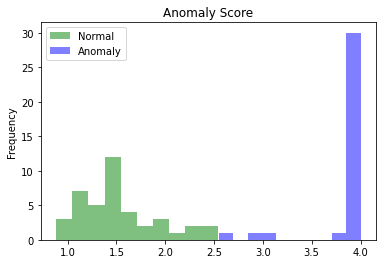

In [ ]:
import matplotlib.pyplot as plt
kwargs = dict(alpha=0.5, bins=10)

plt.hist(normals, **kwargs, color='g', label='Normal')
plt.hist(anomalies, **kwargs, color='b', label='Anomaly')
plt.gca().set(title='Anomaly Score', ylabel='Frequency')
plt.legend()

In [ ]:
import time
speed_dataloader = DataLoader(test_dataset, batch_size=32, pin_memory=False)
model.eval()
torch.cuda.synchronize()
tsince = int(round(time.time()*1000))
with torch.no_grad():
    for i, data in enumerate(tqdm(speed_dataloader)):
        inputs, labels = preprocess_batch(data)
        z = model(inputs)
        break
torch.cuda.synchronize()
ttime_elapsed = int(round(time.time()*1000)) - tsince
print('test time elapsed {}ms'.format(ttime_elapsed))
print('test time elapsed per sample {}ms'.format(ttime_elapsed/speed_dataloader.batch_size))

test time elapsed 1010ms
test time elapsed per sample 31.5625ms


In [ ]:
!nvidia-smi

Mon Dec 28 01:21:20 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    40W / 300W |  15937MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
model = DifferVit()
model.to(device)

DifferNet(
  (feature_extractor): ModifiedVisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU()
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm1): LayerNorm((768,), eps=1e-06, e

In [ ]:
model.load_state_dict(torch.load('profactor_trained.pt'))

<All keys matched successfully>

In [ ]:
def compute_rollout_attention(all_layer_matrices, start_layer=0):
    # adding residual consideration
    num_tokens = all_layer_matrices[0].shape[1]
    batch_size = all_layer_matrices[0].shape[0]
    eye = torch.eye(num_tokens).expand(batch_size, num_tokens, num_tokens).to(all_layer_matrices[0].device)
    all_layer_matrices = [all_layer_matrices[i] + eye for i in range(len(all_layer_matrices))]
    matrices_aug = [all_layer_matrices[i] / all_layer_matrices[i].sum(dim=-1, keepdim=True)
                          for i in range(len(all_layer_matrices))]
    joint_attention = matrices_aug[start_layer]
    for i in range(start_layer+1, len(matrices_aug)):
        joint_attention = matrices_aug[i].bmm(joint_attention)
    return joint_attention


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow 

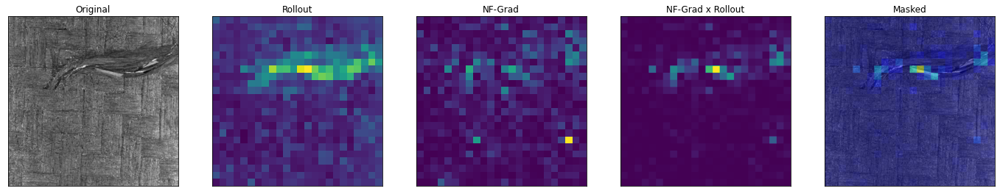

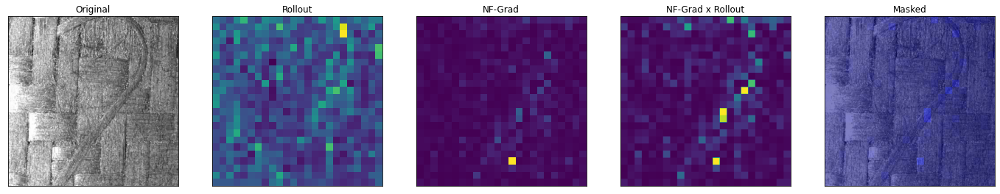

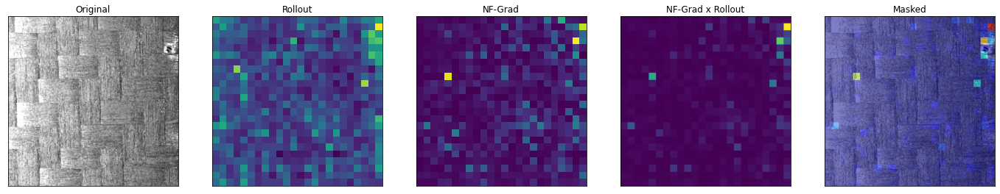

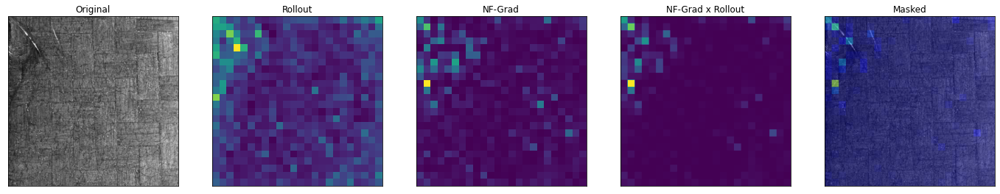

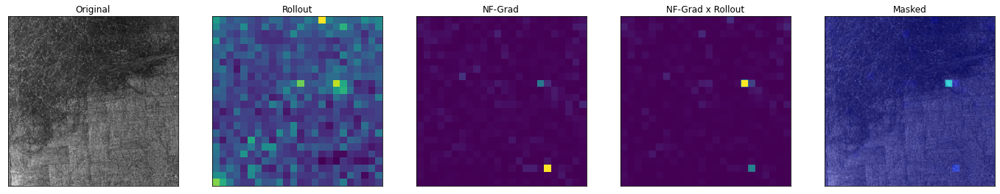

...

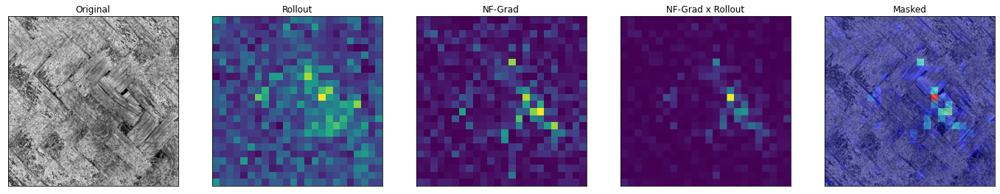

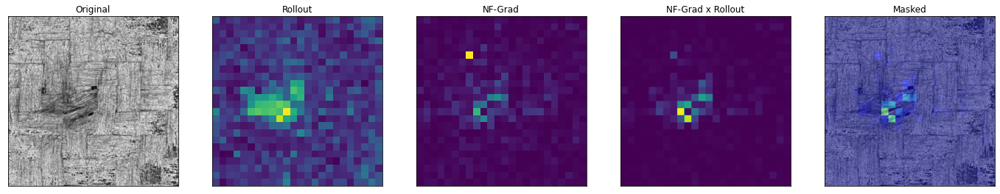

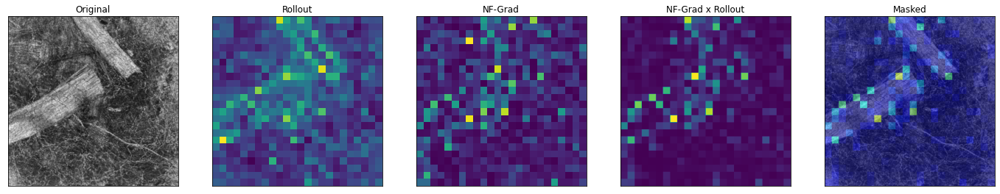

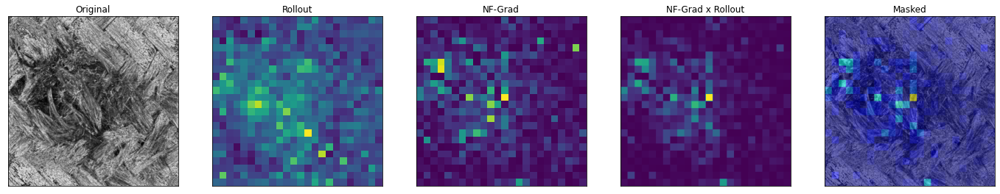

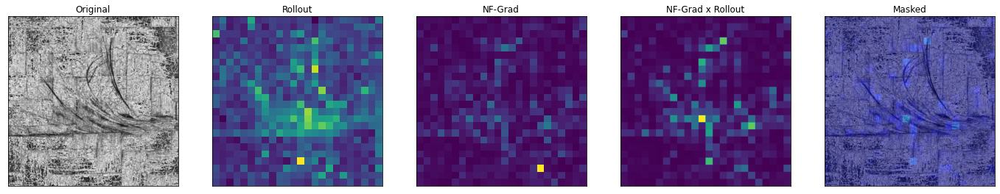

In [ ]:
import cv2

def show_cam_on_image(img, mask):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

cam_test_dataloader = DataLoader(test_dataset, batch_size=1, pin_memory=False)
model.eval()
for i, data in enumerate(tqdm(cam_test_dataloader)):
    model.zero_grad()
    inputs, labels = preprocess_batch(data)
    if not (labels > 0).any():
        continue
    inputs = torch.tensor(inputs, requires_grad=True)
    emb = model(inputs, register_hook=True)
    loss = get_loss(emb, model.nf.jacobian(run_forward=False))
    loss.backward()

    grad = inputs.grad.detach()

    grad_map = torch.nn.functional.interpolate(grad, size = (24,24), mode='bilinear')
    grad_map = torch.abs(grad_map.mean(axis=1).squeeze())
    #grad_map = torch.pow(grad_map,2) #maybe
    grad_map = (grad_map - torch.min(grad_map))/(torch.max(grad_map) - torch.min(grad_map))

    blocks = model.feature_extractor.blocks
    all_layer_attentions = []
    for blk in blocks:
        attn_heads = blk.attn.get_attention_map()
        avg_heads = (attn_heads.sum(dim=1) / attn_heads.shape[1]).detach()
        all_layer_attentions.append(avg_heads)
    rollout = compute_rollout_attention(all_layer_attentions, start_layer=0)
    rollout = rollout[0,0, 1:].reshape(24,24)

    rollout = (rollout - torch.min(rollout))/(torch.max(rollout) - torch.min(rollout))

    grad_rollout = grad_map * rollout 

    grad_rollout_mask  = torch.nn.functional.interpolate(grad_rollout.unsqueeze(0).unsqueeze(1), size = (384,384))
    grad_rollout_mask = grad_rollout_mask.reshape(384, 384).cpu().numpy().squeeze()

    rollout = rollout.cpu().detach().numpy()
    im = inputs[0].cpu().detach().numpy().transpose(1,2,0) * norm_std + norm_mean
    grad_map = grad_map.cpu().detach().numpy()

    vis = show_cam_on_image(im, grad_rollout_mask)
    vis =  np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    fig, (ax1, ax2, ax3,ax4,ax5) = plt.subplots(ncols=5, figsize=(24, 24))
    ax1.set_title('Original')
    ax2.set_title('Rollout')
    ax3.set_title('NF-Grad')
    ax4.set_title('NF-Grad x Rollout')
    ax5.set_title('Masked')
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    ax3.get_xaxis().set_visible(False)
    ax3.get_yaxis().set_visible(False)
    ax4.get_xaxis().set_visible(False)
    ax4.get_yaxis().set_visible(False)
    ax5.get_xaxis().set_visible(False)
    ax5.get_yaxis().set_visible(False)
    _ = ax1.imshow(im)
    _ = ax2.imshow(rollout)
    _ = ax3.imshow(grad_map)
    _ = ax4.imshow(grad_rollout_mask)
    _ = ax5.imshow(vis)
